<a href="https://colab.research.google.com/github/anarakinson/Jim-Detector/blob/main/JIM_CARREY_Facenet_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 4.4MB/s 


In [ ]:
import os
import sys
import pickle
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import Normalizer
from scipy.spatial.distance import cosine

import cv2
import mtcnn

from tensorflow.keras.models import load_model

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path0 = "/content/drive/MyDrive/Colab_Files/jim carrey/"

encoder_model = path0 + 'facenet_keras.h5'
train_dir = path0 + 'train'
encodings_path = path0 + 'encodings.pkl'
test_img_path = path0 + 'test/'
test_res_path = path0 + 'results/'

In [ ]:
# Коэффициент точности распознавания лиц
# чем ниже коэффициент - тем более строгим будет отбор
recognition_t = 0.4

In [ ]:
required_size = (160, 160)
encoding_dict = dict()

# Функции

In [ ]:
def get_encode(face_encoder, face, size):
    '''
    Функция получает вырезанное с фото лицо
    и возвращает полученные по нему набор фичей 
    '''
    face = normalize(face)
    face = cv2.resize(face, size)
    encode = face_encoder.predict(np.expand_dims(face, axis=0))[0]
    return encode


def get_face(img, box):
    '''
    Функция получает изображение, ищет на нем лицо,
    и, если находит, возвращает 
    лицо отдельным изображением и его координаты на фото
    '''
    x1, y1, width, height = box
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    face = img[y1:y2, x1:x2]
    return face, (x1, y1), (x2, y2)


l2_normalizer = Normalizer('l2')


def normalize(img):
    '''
    Функция нормализации изображения
    '''
    mean, std = img.mean(), img.std()
    return (img - mean) / std


def plt_show(cv_img):
    img_rgb = cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.show()


def load_pickle(path):
    with open(path, 'rb') as f:
        encoding_dict = pickle.load(f)
    return encoding_dict


def save_pickle(path, obj):
    with open(path, 'wb') as file:
        pickle.dump(obj, file)


def load_pickle(path):
    with open(path, 'rb') as file:
        return pickle.load(file)

In [ ]:
def get_rect(img, bbox=True):
    '''
    Функция получает на вход фотографию, детектирует на них лица, и определяет,
    принадлежат ли они Джиму.
    Затем возвращает изображение с обведенным лицом и булевую переменную:
    True - Джим
    False - кто-либо еще
    '''
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = face_detector.detect_faces(img_rgb)
    state = False
    for res in results:
        face, pt_1, pt_2 = get_face(img_rgb, res['box'])
        encode = get_encode(face_encoder, face, required_size)
        encode = l2_normalizer.transform(np.expand_dims(encode, axis=0))[0]
        
        name = 'unknown'
        distance = float("inf")
        
        for db_name, db_encode in encoding_dict.items():
            dist = cosine(db_encode, encode)
            if dist < recognition_t and dist < distance:
                name = 'Jim'
                distance = dist
        if name == 'unknown':
            if bbox:
                cv2.rectangle(img, pt_1, pt_2, (0,0, 255),1)
                cv2.putText(img,name, pt_1,cv2.FONT_HERSHEY_PLAIN, 1, (0,0,255), 1)
            else:
                pass
        else:
            if bbox:
                cv2.rectangle(img, pt_1, pt_2, (0, 255, 0),1)
                cv2.putText(img,name + f"__{distance:.2f}", pt_1 ,cv2.FONT_HERSHEY_PLAIN, 1, (0,255,0), 1)
            state = True
    return img, state

In [ ]:
def make_video(path, images, frame_w, frame_h):
    '''
    Функция записывает видео из полученных массивов
    '''
    video_writer = cv2.VideoWriter(path,
                                cv2.VideoWriter_fourcc(*'MPEG'), 
                                25.0, 
                                (frame_w, frame_h))

    # собираем все кадры в видео
    for i in range(len(images)):
        video_writer.write(images[i])

    # Ставим "точку", завершаем
    video_reader.release()
    video_writer.release()

# Нейронные сети

In [ ]:
# MTCNN - обученный нейронный детектор лиц
face_detector = mtcnn.MTCNN()
# В качестве энкодера используется предобученная нейросеть Keras-Facent 
# из репозитория Nyoki-mtl
face_encoder = load_model(encoder_model)

## Извлечение карт фичей

In [ ]:
# Получаем фичи лица Джима из 30 разных фильмов и передач
# Для этого используются две модели
# MTCNN - детектирует лица и вытаскивает их с фотографии
# Facenet - получает эти лица и раскладывает их на фичи.
# Фичи складываются и нормализуются для получения некоего "среднего" значения, 
# соответствующего всем лицам, которые относятся к передаче
# Затем все наборы фичей сохраняются в словаре

for person_name in os.listdir(train_dir):
    print(person_name)
    person_dir = os.path.join(train_dir, person_name)
    encodes = []
    for img_name in os.listdir(person_dir):
        img_path = os.path.join(person_dir, img_name)
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = face_detector.detect_faces(img_rgb)
        if results:
            res = max(results, key=lambda b: b['box'][2] * b['box'][3])
            face, _, _ = get_face(img_rgb, res['box'])
            
            face = normalize(face)
            face = cv2.resize(face, required_size)
            encode = face_encoder.predict(np.expand_dims(face, axis=0))[0]
            encodes.append(encode)
        
    if encodes:
        encode = np.sum(encodes[i:i+slices], axis=0)
        encode = l2_normalizer.transform(np.expand_dims(encode, axis=0))[0]
        encoding_dict[person_name+'-'+str(i)] = encode

jim9
jim8
jim7
jim6
jim31
jim29
jim30
jim5
jim4
jim3
jim27
jim28
jim26
jim25
jim24
jim20
jim15
jim18
jim22
jim23
jim19
jim21
jim17
jim14
jim13
jim12
jim11
jim10
jim1
jim0


## Запись полученных карт фичей в .pickle

In [ ]:
save_pickle(encodings_path, encoding_dict)

In [ ]:
encoding_dict = load_pickle(encodings_path)

# Проверка на тестовом изображении

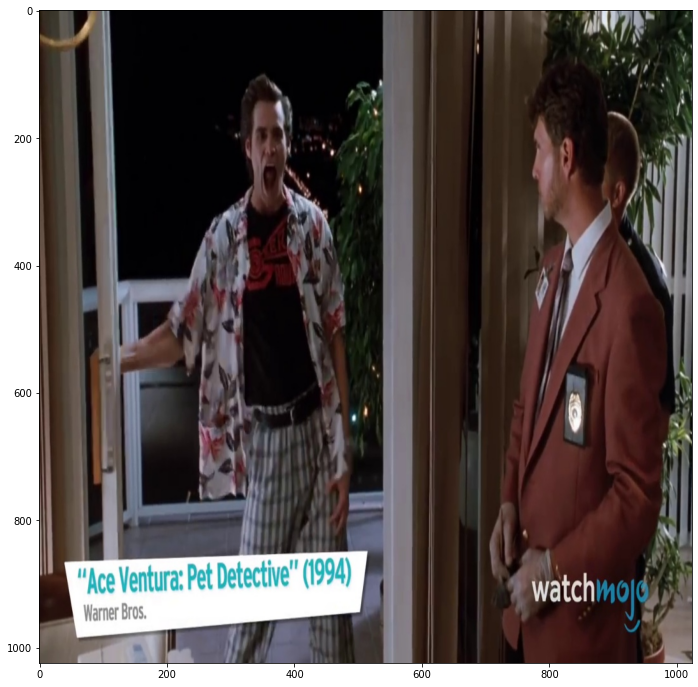

In [ ]:
plt.figure(figsize=(12,12))
img = cv2.imread(test_img_path + os.listdir(test_img_path)[0])
plt_show(img)

True


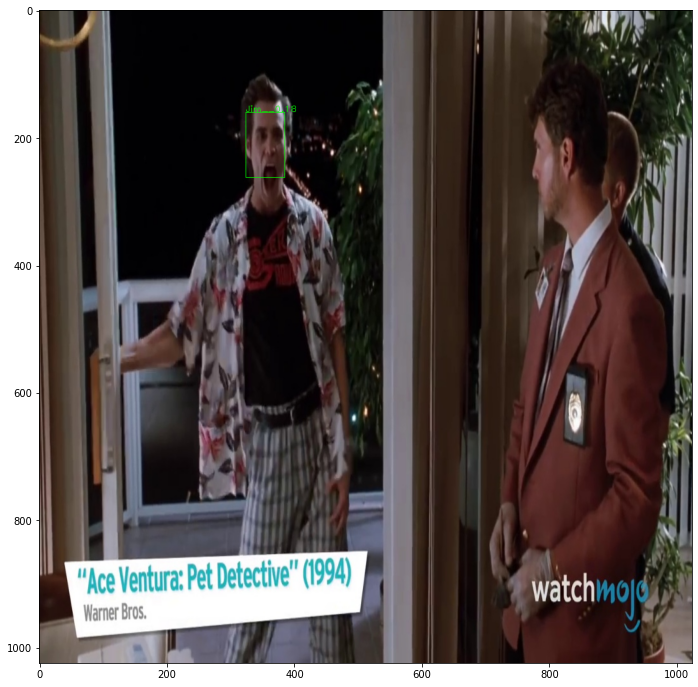

In [ ]:
plt.figure(figsize=(12,12))
img_, st = get_rect(img)
print(st)
plt_show(img_)

# Проверка системы на видео

In [ ]:
!pip install youtube_dl   

     |████████████████████████████████| 1.9MB 4.2MB/s 


In [ ]:
import youtube_dl
from IPython.display import YouTubeVideo, clear_output
from moviepy.editor import *
from tqdm import tqdm_notebook

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)1523712/45929032 bytes (3.3%)4014080/45929032 bytes (8.7%)7192576/45929032 bytes (15.7%)10428416/45929032 bytes (22.7%)13762560/45929032 bytes (30.0%)16908288/45929032 bytes (36.8%)20152320/45929032 bytes (43.9%)23044096/45929032 bytes (50.2%)26402816/45929032 bytes (57.5%)29581312/45929032 bytes (64.4%)32948224/45929032 bytes (71.7%)36126720/45929032 bytes (78.7%)3

### Загружаем видео с ютуба, или указываем путь к загруженному

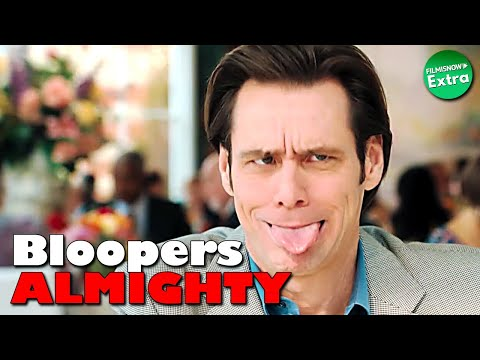

In [ ]:
url = 'B0tzQZGDXOc'
YouTubeVideo(url, start=100)

In [ ]:
!rm test.mp4 out.mp4

# Загружаем видео посвященное Джиму с youtube
!youtube-dl -f mp4 --output "Jim_full.%(ext)s" 'https://www.youtube.com/watch?v={url}'

# Для удобства вырежем одноминутный отрезок
!ffmpeg -i '/content/Jim_full.mp4' -s 360x250 -ss 00:01:00.00 -t 00:02:00.00 -c copy Jim.mp4

rm: cannot remove 'test.mp4': No such file or directory
rm: cannot remove 'out.mp4': No such file or directory
[youtube] B0tzQZGDXOc: Downloading webpage
[download] Destination: Jim_full.mp4
[download] 100% of 108.00MiB in 00:02
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsna

### Запускаем систему на указанном видео

In [ ]:
video_ = '/content/drive/MyDrive/Colab_Files/jim carrey/Shou_Trumana_Kinosimka.RU (online-video-cutter.com).mp4'

In [ ]:
# Создаем класс для чтения видео
video_reader = cv2.VideoCapture(video_)

nb_frames = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
frame_h   = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_w   = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
fps       = int(video_reader.get(cv2.CAP_PROP_FPS))

images = []
wrong_imgs = []
screen_time = 0.

print(nb_frames)

counter = 0
while True:
    counter += 1
    if counter % 100 == 0:
        clear_output()
        print(round((counter / nb_frames) * 100, 2), '% processed')
    # Обрабатываем каждый фрейм видео
    stopper, img = video_reader.read()
    if not stopper:
        break
    # По каждому кадру делаем предикт
    image_pred, state = get_rect(img)
    # Если энкодер задетектировал лицо Джима - добавляем в соответствующий список
    if state:
        images.append(image_pred)
        screen_time += 1./fps
    if not state:
        wrong_imgs.append(image_pred)

0.36 % processed


KeyboardInterrupt: ignored

# Результат на видео с ютуб

### Кадры, на которых Facenet увидела Джима

In [ ]:
path = '/content/predict.mp4'
make_video(path, images, frame_w, frame_h)

In [ ]:
clip=VideoFileClip('/content/predict.mp4')
clip.ipython_display(width=640, center=False, fps=25)

In [ ]:
print('Предположительное экранное время: %.2f сек.' % screen_time)

Предположительное экранное время: 3.68 сек.


### Kадры, отбракованные энкодером

In [ ]:
path = '/content/wrong_images1.mp4'
make_video(path, wrong_imgs[:len(wrong_imgs)//2], frame_w, frame_h)

path = '/content/wrong_images2.mp4'
make_video(path, wrong_imgs[len(wrong_imgs)//2:], frame_w, frame_h)

path = '/content/wrong_images.mp4'
make_video(path, wrong_imgs, frame_w, frame_h)

In [ ]:
clip=VideoFileClip('/content/wrong_images1.mp4')
clip.ipython_display(width=640, center=False, fps=25)

In [ ]:
clip=VideoFileClip('/content/wrong_images2.mp4')
clip.ipython_display(width=640, center=False, fps=25)

# Результат на тестовом видео

### Экранное время Джима 
При записи фпс был уменьшен вдвое, для экономии времени и памяти. По этой причине длительность ролика не совпадает с длительностью, зафиксированной системой

In [ ]:
path = '/content/Truman.mp4'
make_video(path, images, frame_w, frame_h)

In [ ]:
clip=VideoFileClip('/content/Truman.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
print('Предположительное экранное время: %.2f сек.' % (screen_time))

Предположительное экранное время: 30.23 сек.


### Остальные кадры

In [ ]:
slices = len(wrong_imgs)//4
path = '/content/wrong_Truman1.mp4'
make_video(path, wrong_imgs[:slices], frame_w, frame_h)

path = '/content/wrong_Truman2.mp4'
make_video(path, wrong_imgs[slices:slices*2], frame_w, frame_h)

path = '/content/wrong_Truman3.mp4'
make_video(path, wrong_imgs[slices*2:slices*3], frame_w, frame_h)

path = '/content/wrong_Truman4.mp4'
make_video(path, wrong_imgs[slices*3:], frame_w, frame_h)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman1.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman2.mp4')
clip.ipython_display(width=640, center=False, fps=fps

In [ ]:
clip=VideoFileClip('/content/wrong_Truman3.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

100%|██████████| 338/338 [00:02<00:00, 115.63it/s]


In [ ]:
clip=VideoFileClip('/content/wrong_Truman4.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

100%|██████████| 338/338 [00:02<00:00, 115.63it/s]


# Результат на тестовом видео

### Экранное время Джима 
Обработана была только треть видеоролика

In [ ]:
path = '/content/Truman.mp4'
make_video(path, images, frame_w, frame_h)

slices = len(images)//3

path = '/content/Truman1.mp4'
make_video(path, images[:slices], frame_w, frame_h)

path = '/content/Truman2.mp4'
make_video(path, images[slices:slices*2], frame_w, frame_h)

path = '/content/Truman3.mp4'
make_video(path, images[slices*2:], frame_w, frame_h)

In [ ]:
clip=VideoFileClip('/content/Truman1.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/Truman2.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/Truman3.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
print('Предположительное экранное время: %.2f сек.' % (screen_time))

Предположительное экранное время: 119.52 сек.


### Остальные кадры

In [ ]:
slices = len(wrong_imgs)//10
path = '/content/wrong_Truman1.mp4'
make_video(path, wrong_imgs[:slices], frame_w, frame_h)

path = '/content/wrong_Truman2.mp4'
make_video(path, wrong_imgs[slices:slices*2], frame_w, frame_h)

path = '/content/wrong_Truman3.mp4'
make_video(path, wrong_imgs[slices*2:slices*3], frame_w, frame_h)

path = '/content/wrong_Truman4.mp4'
make_video(path, wrong_imgs[slices*3:slices*4], frame_w, frame_h)

path = '/content/wrong_Truman5.mp4'
make_video(path, wrong_imgs[slices*4:slices*5], frame_w, frame_h)

path = '/content/wrong_Truman.mp4'
make_video(path, wrong_imgs, frame_w, frame_h)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman1.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman2.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman3.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman4.mp4')
clip.ipython_display(width=640, center=False, fps=fps)

In [ ]:
clip=VideoFileClip('/content/wrong_Truman5.mp4')
clip.ipython_display(width=640, center=False, fps=fps)